In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [2]:
import multiprocessing
from fastai.conv_learner import *
from fasterai.images import *
from fasterai.dataset import *
from fasterai.visualize import *
from pathlib import Path
from itertools import repeat
#torch.cuda.set_device(1)
plt.style.use('dark_background')
torch.backends.cudnn.benchmark=True

/home/jason/anaconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/jason/anaconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/jason/anaconda3/envs/fastai/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/jason/anaconda3/envs/fastai/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [3]:
DATA_PATH = Path('data/imagenet/ILSVRC/Data/CLS-LOC')
TRAIN_SOURCE_PATH = DATA_PATH/'train'
uid = 'bw2color'
#keep_pct=0.02
keep_pct=0.02
#keep_pct=0.005
#keep_pct=1.0

In [4]:
def get_model_data(image_size: int, batch_size: int, keep_pct: float):
    TRAIN_X_PATH = generate_image_preprocess_path(TRAIN_SOURCE_PATH, is_x=True, size=image_size, uid=uid)
    TRAIN_Y_PATH = generate_image_preprocess_path(TRAIN_SOURCE_PATH, is_x=False, size=image_size, uid=uid)
    x_paths, y_paths = get_matched_xy_file_lists(TRAIN_X_PATH, TRAIN_Y_PATH)
    x_paths_str = convert_paths_to_str(x_paths)
    y_paths_str = convert_paths_to_str(y_paths)
    print(x_paths_str[:5])
    print(y_paths_str[:5])
    np.random.seed(42)
    keeps = np.random.rand(len(x_paths_str)) < keep_pct
    fnames_x = np.array(x_paths_str, copy=False)[keeps]
    fnames_y = np.array(y_paths_str, copy=False)[keeps]
    val_idxs = get_cv_idxs(len(fnames_x), val_pct=min(0.01/keep_pct, 0.1))
    ((val_x,trn_x),(val_y,trn_y)) = split_by_idx(val_idxs, np.array(fnames_x), np.array(fnames_y))
    img_fn = TRAIN_Y_PATH/'n01558993'/'n01558993_9684.JPEG'
    tfms = tfms_from_model(vgg16, image_size, tfm_y=TfmType.PIXEL, aug_tfms=transforms_side_on, sz_y=image_size)
    datasets = ImageData.get_ds(MatchedFilesDataset, (trn_x,trn_y), (val_x,val_y), tfms, path=TRAIN_Y_PATH.parent)
    md = ImageData(DATA_PATH, datasets, batch_size, num_workers=16, classes=None)
    return md

In [5]:
md = get_model_data(image_size=64, batch_size=256, keep_pct=keep_pct)
denorm = md.val_ds.denorm

['train_x_bw2color_64/n01440764/n01440764_10026.JPEG', 'train_x_bw2color_64/n01440764/n01440764_10027.JPEG', 'train_x_bw2color_64/n01440764/n01440764_10029.JPEG', 'train_x_bw2color_64/n01440764/n01440764_10040.JPEG', 'train_x_bw2color_64/n01440764/n01440764_10042.JPEG']
['train_y_bw2color_64/n01440764/n01440764_10026.JPEG', 'train_y_bw2color_64/n01440764/n01440764_10027.JPEG', 'train_y_bw2color_64/n01440764/n01440764_10029.JPEG', 'train_y_bw2color_64/n01440764/n01440764_10040.JPEG', 'train_y_bw2color_64/n01440764/n01440764_10042.JPEG']


In [6]:
def generate_denormed_image_pairs(ds: FilesDataset, batches: [(ndarray,ndarray)], idx:int = 0):
    return [(ds.denorm(x)[idx], ds.denorm(y)[idx])for (x,y) in batches]

In [7]:
#batches = [next(iter(md.aug_dl)) for i in range(9)]

In [8]:
#image_pairs = generate_denormed_image_pairs(md.val_ds, batches)
#plot_images_from_ndarray_pairs(image_pairs, figsize=(20,10))

## Model

##### TODO:  Try using unet instead of SrResnet- also suspect that using pretrained model as base will work much better.
##### TODO:  Also try making the loss/output based on "classification" like in Zhang et al.
##### TODO:  After making unet version- plug that into a Weiserman GAN setup (the discrimator looks at grey image and colorized image, concatenated together via channels).
##### TODO:  Try using higher res images (from FloydHub blog?)
##### TODO:  Why freezeto(1)...?  Seems like we should be training everything after the model cut at the very least....
##### TODO:  Try perceptual loss again....

In [9]:
def icnr(x, scale=2, init=nn.init.kaiming_normal):
    new_shape = [int(x.shape[0] / (scale ** 2))] + list(x.shape[1:])
    subkernel = torch.zeros(new_shape)
    subkernel = init(subkernel)
    subkernel = subkernel.transpose(0, 1)
    subkernel = subkernel.contiguous().view(subkernel.shape[0],
                                            subkernel.shape[1], -1)
    kernel = subkernel.repeat(1, 1, scale ** 2)
    transposed_shape = [x.shape[1]] + [x.shape[0]] + list(x.shape[2:])
    kernel = kernel.contiguous().view(transposed_shape)
    kernel = kernel.transpose(0, 1)
    return kernel

In [10]:
class SaveFeatures():
    features=None
    def __init__(self, m): 
        self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output): 
        self.features = output
    def remove(self): 
        self.hook.remove()

In [11]:
class FeatureLoss(nn.Module):
    def __init__(self, block_wgts: [float] = [0.2,0.7,0.1]):
        super().__init__()
        m_vgg = vgg16(True)
        
        blocks = [i-1 for i,o in enumerate(children(m_vgg))
              if isinstance(o,nn.MaxPool2d)]
        blocks, [m_vgg[i] for i in blocks]
        layer_ids = blocks[:3]
        
        vgg_layers = children(m_vgg)[:23]
        m_vgg = nn.Sequential(*vgg_layers).cuda().eval()
        set_trainable(m_vgg, False)
        
        self.m,self.wgts = m_vgg,block_wgts
        self.sfs = [SaveFeatures(m_vgg[i]) for i in layer_ids]

    def forward(self, input, target, sum_layers=True):
        self.m(VV(target.data))
        res = [F.l1_loss(input,target)/100]
        targ_feat = [V(o.features.data.clone()) for o in self.sfs]
        self.m(input)
        res += [F.l1_loss(self.flatten(inp.features),self.flatten(targ))*wgt
               for inp,targ,wgt in zip(self.sfs, targ_feat, self.wgts)]
        if sum_layers: res = sum(res)
        return res
    
    def flatten(self, x): 
        return x.view(x.size(0), -1)
    
    def close(self):
        for o in self.sfs: o.remove()

In [12]:
def conv(ni, nf, kernel_size=3, actn=False):
    layers = [nn.Conv2d(ni, nf, kernel_size, padding=kernel_size//2)]
    if actn: layers.append(nn.ReLU(True))
    return nn.Sequential(*layers)

In [13]:
class UpSampleBlock(nn.Module):
    def __init__(self, ni, nf, scale=2):
        super().__init__()
        layers = []
        for i in range(int(math.log(scale,2))):
            layers += [conv(ni, nf*4), nn.PixelShuffle(2)]
        self.sequence = nn.Sequential(*layers)
        self.icnr_init()
        
    def icnr_init(self):
        conv_shuffle = self.sequence[0][0]
        kernel = icnr(conv_shuffle.weight)
        conv_shuffle.weight.data.copy_(kernel);
    
    def forward(self, x):
        return self.sequence(x)

In [14]:
class UpSampleBlock2(nn.Module):
    def __init__(self, scale=2):
        super().__init__()
        layers = []
        for i in range(int(math.log(scale,2))):
            layers += [nn.Upsample(scale_factor=2, mode='nearest')]
        self.sequence = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.sequence(x)

In [15]:
class UnetBlock(nn.Module):
    def __init__(self, up_in, x_in, n_out):
        super().__init__()
        up_out = x_out = n_out//2
        self.x_conv  = nn.Conv2d(x_in,  x_out,  1)
        self.tr_conv = UpSampleBlock(up_in, up_out, 2)
        self.bn = nn.BatchNorm2d(n_out)
        
    def forward(self, up_p, x_p):
        up_p = self.tr_conv(up_p)
        x_p = self.x_conv(x_p)
        cat_p = torch.cat([up_p,x_p], dim=1)
        return self.bn(F.relu(cat_p))

In [16]:
class Unet34(nn.Module):  
    @staticmethod
    def generate_base_model():
        f = resnet34
        cut,lr_cut = model_meta[f]
        layers = cut_model(f(True), cut)
        return nn.Sequential(*layers), lr_cut
    
    def __init__(self, nf=256):
        super().__init__()
        self.name = 'unet'
        rn, lr_cut = Unet34.generate_base_model()
        self.rn = rn
        self.lr_cut = lr_cut
        self.sfs = [SaveFeatures(rn[i]) for i in [2,4,5,6]]
        self.up1 = UnetBlock(512,256,nf)
        self.up2 = UnetBlock(nf,128,nf)
        self.up3 = UnetBlock(nf,64,nf)
        self.up4 = UnetBlock(nf,64,nf)
        self.up5 = UpSampleBlock(C, 2)      
        self.out= nn.Sequential(nn.BatchNorm2d(nf),conv(nf, 3, kernel_size=1))
           
    def forward(self, x):
        x = F.relu(self.rn(x))
        x = self.up1(x, self.sfs[3].features)
        x = self.up2(x, self.sfs[2].features)
        x = self.up3(x, self.sfs[1].features)
        x = self.up4(x, self.sfs[0].features)
        x = self.up5(x)
        x = self.out(x)
        return x
    
    def close(self):
        for sf in self.sfs: 
            sf.remove()

In [17]:
class UnetModel():
    def __init__(self):
        self.model = to_gpu(Unet34())
        self.name = 'unet'

    def get_layer_groups(self, precompute):
        lgs = list(split_by_idxs(children(self.model.rn), [self.model.lr_cut]))
        return lgs + [children(self.model)[1:]]

In [18]:
class ResSequential(nn.Module):
    def __init__(self, layers, res_scale=1.0):
        super().__init__()
        self.res_scale = res_scale
        self.m = nn.Sequential(*layers)

    def forward(self, x): return x + self.m(x) * self.res_scale

In [19]:
def res_block(nf):
    return ResSequential(
        [conv(nf, nf, actn=True), conv(nf, nf)],
        0.1)

In [20]:
class StdUpsample(nn.Module):
    def __init__(self, nin, nout):
        super().__init__()
        self.conv = nn.ConvTranspose2d(nin, nout, 2, stride=2)
        self.bn = nn.BatchNorm2d(nout)
        
    def forward(self, x): 
        return self.bn(F.relu(self.conv(x)))

In [21]:
class ImageModifierModel(nn.Module):
    @staticmethod
    def generate_base_model():
        f = resnet34
        cut,lr_cut = model_meta[f]
        layers = cut_model(f(True), cut)
        return nn.Sequential(*layers), lr_cut
    
    def __init__(self):
        super().__init__() 
        rn, lr_cut = ImageModifierModel.generate_base_model()
        self.rn = rn
        self.lr_cut = lr_cut
        self.sfs = [SaveFeatures(rn[i]) for i in [2,4,5,6]]
        
        self.up1 = UpSampleBlock2(16) #256 in
        self.up2 = UpSampleBlock2(8)  #128 in
        self.up3 = UpSampleBlock2(4)   #64 in
        self.up4 = UpSampleBlock2(2)   #64 in  
        
        mid_layers = []
        mid_layers += [conv(512,64, kernel_size=1), nn.BatchNorm2d(64)]
        for i in range(8): mid_layers.append(res_block(64))
        mid_layers += [conv(64,64), nn.BatchNorm2d(64), conv(64, 3)]
        self.upconv = nn.Sequential(*mid_layers)
             
        out_layers = []
        #for i in range(8): out_layers.append(res_block(64))
        out_layers += [conv(6,6),  nn.BatchNorm2d(6), conv(6,3)]
        self.out = nn.Sequential(*out_layers)
        
    def forward(self, x): 
        self.rn(x)
        x1 = self.up1(self.sfs[3].features)
        x2 = self.up2(self.sfs[2].features)
        x3 = self.up3(self.sfs[1].features)
        x4 = self.up4(self.sfs[0].features) 
        x5 = self.upconv(torch.cat([x1, x2, x3, x4], dim=1))
        return self.out(torch.cat([x, x5], dim=1))

In [22]:
class ImageModifierModelWrapper():
    def __init__(self):
        self.model = to_gpu(ImageModifierModel())
        self.name = 'imod'

    def get_layer_groups(self, precompute):
        lgs = list(split_by_idxs(children(self.model.rn), [self.model.lr_cut]))
        return lgs + [children(self.model)[1:]]

## Training

In [23]:
def train(lrs, session_num: int, cycle_len=2, use_clr_beta=(20,10,0.95,0.85)):
    if session_num > 0:
        learn.load(uid + '_2_' + str(session_num - 1))
    learn.fit(lrs, 1, cycle_len=cycle_len, wds=wd, use_clr_beta=use_clr_beta)
    learn.save(uid + '_2_' + str(session_num))

In [24]:
def visualize(start_idx: int, count: int, figsize=(20,20), max_colums=4):
    end_index = start_idx + count
    plot_image_outputs_from_model(md.val_ds, learn.model, list(range(start_idx,end_index)), figsize=figsize, max_columns=max_colums)

In [25]:
#m = SrResnet(64, 1)
#imod = ImageModifierModelWrapper()
imod = ImageModifierModelWrapper()
learn = ConvLearner(md, imod)
learn.metrics = []
learn.opt_fn=optim.Adam
learn.crit = F.mse_loss #(turns sepia/blurry)
#learn.crit = FeatureLoss()
#learn.crit = F.l1_loss
wd=1e-7
#learn.models.model = nn.DataParallel(learn.models.model, [0,1,2,3])

In [ ]:
learn.freeze_to(1)

In [ ]:
learn.lr_find(1e-3, 1e2, wds=wd, linear=False)

In [ ]:
learn.sched.plot(n_skip=0, n_skip_end=0)

In [ ]:
lr=1e-2
lrs = np.array([lr/100,lr/10,lr])

In [ ]:
train(lr,0,cycle_len=2, use_clr_beta=(5,8,0.95,0.85)) 
visualize(220,8)

In [ ]:
learn.unfreeze()
learn.bn_freeze(True)

In [ ]:
train(lrs/4,1,cycle_len=2,use_clr_beta=(20,10,0.95,0.85)) 
visualize(220,8)

## 128 x 128

In [ ]:
learn.freeze_to(1)

In [ ]:
md = get_model_data(image_size=128, batch_size=64, keep_pct=keep_pct)
learn.set_data(md)

In [ ]:
lr=lr/8
lrs = np.array([lr/100,lr/10,lr])

In [ ]:
train(lrs,2,cycle_len=2, use_clr_beta=(5,5,0.95,0.85)) 
visualize(220,8)

In [ ]:
visualize(40,64, figsize=(20,160))

In [ ]:
learn.unfreeze()
learn.bn_freeze(True)

In [ ]:
train(lrs/4,3,cycle_len=2, use_clr_beta=(20,8,0.95,0.85)) 
visualize(220,8)

## 224 x 224

In [26]:
learn.freeze_to(1)

In [27]:
md = get_model_data(image_size=224, batch_size=16, keep_pct=keep_pct)
learn.set_data(md)

['train_x_bw2color_224/n01440764/n01440764_10026.JPEG', 'train_x_bw2color_224/n01440764/n01440764_10027.JPEG', 'train_x_bw2color_224/n01440764/n01440764_10029.JPEG', 'train_x_bw2color_224/n01440764/n01440764_10040.JPEG', 'train_x_bw2color_224/n01440764/n01440764_10042.JPEG']
['train_y_bw2color_224/n01440764/n01440764_10026.JPEG', 'train_y_bw2color_224/n01440764/n01440764_10027.JPEG', 'train_y_bw2color_224/n01440764/n01440764_10029.JPEG', 'train_y_bw2color_224/n01440764/n01440764_10040.JPEG', 'train_y_bw2color_224/n01440764/n01440764_10042.JPEG']


In [ ]:
learn.lr_find(1e-4, 1e1, wds=wd, linear=False)

In [ ]:
learn.sched.plot(n_skip=0, n_skip_end=0)

In [28]:
#lr=lr/8
lr =1e-3
lrs = np.array([lr/100,lr/10,lr])

epoch      trn_loss   val_loss   
    0      0.837672   0.385933  
    1      0.804969   0.342696  



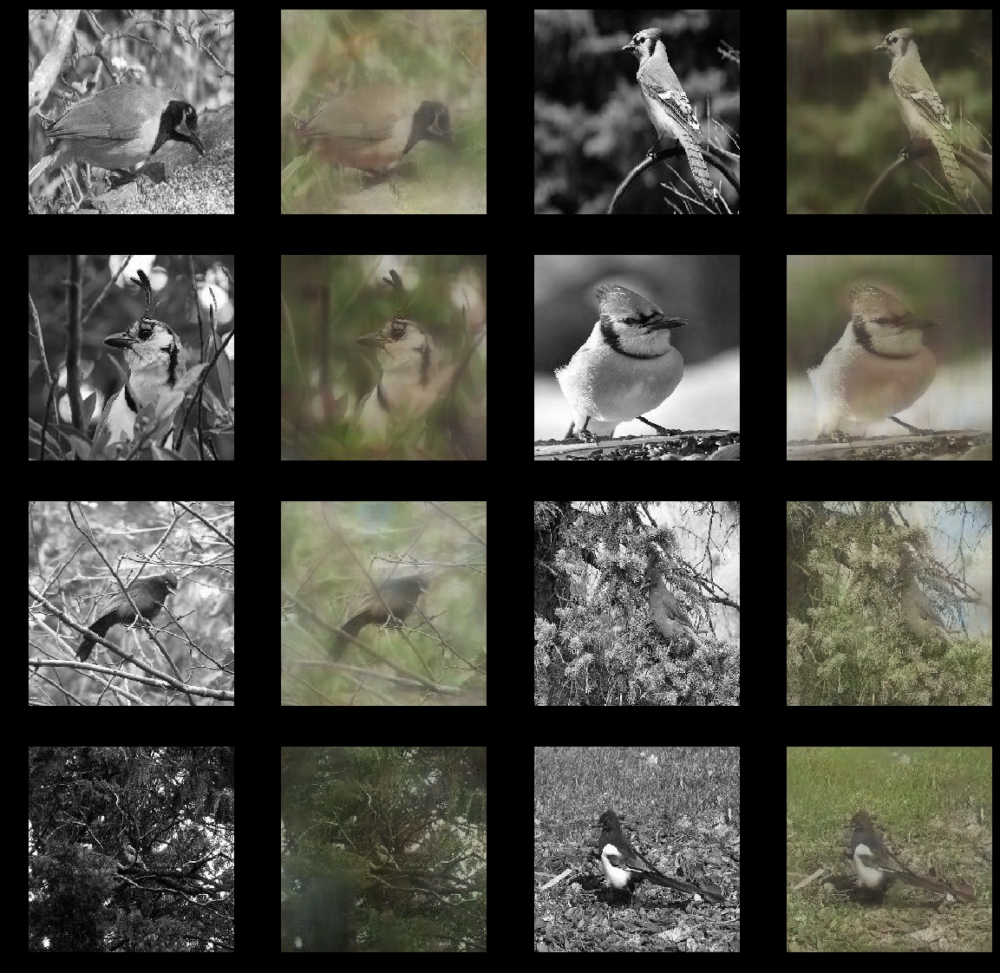

In [29]:
train(lrs,0,cycle_len=2, use_clr_beta=(5,4,0.95,0.85)) 
visualize(220,8)

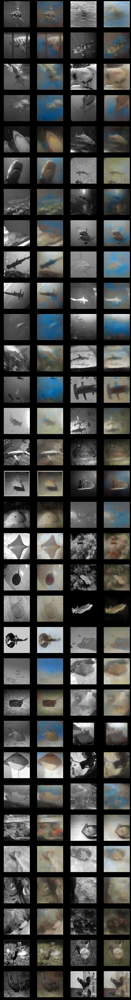

In [30]:
visualize(40,64, figsize=(20,160))

In [31]:
learn.unfreeze()
learn.bn_freeze(True)

In [32]:
#train(lrs/10,1,cycle_len=2,use_clr_beta=(20,8,0.95,0.85)) 
train(lrs/10,1,cycle_len=2,use_clr_beta=(20,8,0.95,0.85)) 
visualize(220,8)

  1%|          | 237/39234 [02:22<6:31:05,  1.66it/s, loss=0.82] 

KeyboardInterrupt: 

In [ ]:
#train(lrs/20,2,cycle_len=2,use_clr_beta=(20,8,0.95,0.85)) 
train(lrs/20,2,cycle_len=2,use_clr_beta=(20,8,0.95,0.85)) 
visualize(220,8)

In [ ]:
visualize(40,64, figsize=(20,160))

In [ ]:
train(lrs/40,3,cycle_len=2,use_clr_beta=(20,8,0.95,0.85)) 
visualize(220,8)

In [ ]:
visualize(40,64, figsize=(20,160))

In [ ]:
train(lrs/80,4,cycle_len=2,use_clr_beta=(20,8,0.95,0.85)) 
visualize(220,8)

In [ ]:
visualize(40,64, figsize=(20,160))

In [ ]:
train(lrs/160,5,cycle_len=2,use_clr_beta=(20,8,0.95,0.85)) 
visualize(220,8)

In [ ]:
visualize(40,64, figsize=(20,160))